# head: hyperparameters and ODE

In [29]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"#否则内核时常挂掉
import torch
import torch.nn as nn
from time import perf_counter
from PIL import Image
import matplotlib.pyplot as plt
from functools import partial
import numpy as np
import requests
# check if GPU is available and use it; otherwise use CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device = torch.device("cpu")


###################### NN the network used by Lagaris et al. 1997 ######################
neurons=10# neurons in hidden layer
NN = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))
batchsize = 10 # how many points to use per epoch
epochs = 20 # number of epochs

###################### ODE ######################
# IC
uo=0

# U functional/operator with NN: satisfies IC by construction
U = lambda t: uo + t * NN(t)

# right hand side functional/operator
f = lambda t, u: torch.exp(-t/ 5.0) * torch.cos(t) - u/ 5.0

# loss function
def loss(t):
    t.requires_grad = True
    Uot=U(t)
    dudt=torch.autograd.grad(Uot,t,grad_outputs=torch.ones_like(Uot),create_graph=True)[0]
    return torch.mean((dudt-f(t,Uot))**2)

## dynamic with no animation

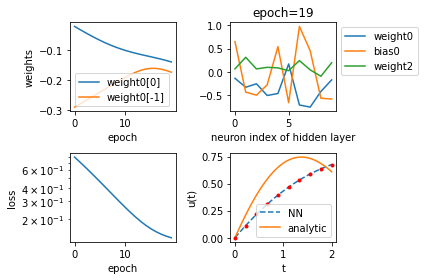

In [16]:
from IPython import display

# reinitialize to clear trained nets
NN = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))

epochList = [];w1List = [];w2List = [];lossList=[];
############################################ train ############################################
# Let's see now if a stochastic optimizer makes a difference
adam = torch.optim.Adam(NN.parameters(), lr=0.01)
# Adam: one-step optimization of stochastic objective function based on adaptive estimation of low-order moments. 

tspan = np.linspace(0, 2, 100)[:, None]
uA = np.exp(-tspan/ 5.0) * np.sin(tspan)# analytic

t=torch.linspace(0, 2, batchsize).reshape(-1,1)

for epoch in range(epochs):
    # Randomly pick batchsize*random t's:
#     t = 2 * torch.rand(batchsize, 1)# t=2*torch.rand(1,batchsize)不行
#     print(t)
    
    # Zero-out the gradient buffers
    adam.zero_grad()
    # Evaluate the loss
    l = loss(t)
    # Calculate the gradients
    l.backward()
    # Update the network
    adam.step()

    weight0=list(NN[0].parameters())[0];weight0=weight0.detach().numpy();
    bias0 = list(NN[0].parameters())[1];bias0 = bias0.detach().numpy();
    weight2 = list(NN[2].parameters())[0];weight2 = weight2.detach().numpy();
    
    display.clear_output(wait=True)#画在同一图
    fig = plt.figure()

    epochList.append(epoch)
    w1List.append(float(weight0[0]))
    w2List.append(float(weight0[-1]))
    lossList.append(float(l)) 
    fig.add_subplot(2,2,1);

    plt.plot(epochList, w1List, label='weight0[0]')
    plt.plot(epochList, w2List, label='weight0[-1]')
#     plt.plot(epochList, w1List,'k',epochList, w2List,'r')
    legend = plt.legend();
    plt.xlabel('epoch');plt.ylabel('weights')
    
    fig.add_subplot(2,2,3);plt.semilogy(epochList, lossList)
    plt.xlabel('epoch');plt.ylabel('loss')
 
    fig.add_subplot(2,2,2);
#     plt.plot(np.squeeze(weight0), color = 'black', label = 'weight0');
#     plt.plot(np.squeeze(weight2), color = 'red', label = 'weight2');
    plt.plot(np.squeeze(weight0),label='weight0');
    plt.plot(np.squeeze(bias0),label='bias0');
    plt.plot(np.squeeze(weight2),label='weight2');
    plt.title(f"epoch={epoch}");plt.xlabel('neuron index of hidden layer')
    legend = plt.legend(bbox_to_anchor=(1, 1));
#     frame = legend.get_frame()

    fig.add_subplot(2,2,4);
    with torch.no_grad():
        uNN = U(torch.Tensor(tspan)).numpy()
    plt.plot(tspan, uNN,'--', label='NN');plt.plot(tspan, uA, label='analytic');
    plt.plot(t.detach().numpy(), U(torch.Tensor(t)).detach().numpy(), 'r.')
    plt.xlabel('t');plt.ylabel('u(t)');legend = plt.legend();
    
    plt.tight_layout()#否则图部分遮住
    plt.pause(0.01)
    plt.show()
# print(epoch)

## animation

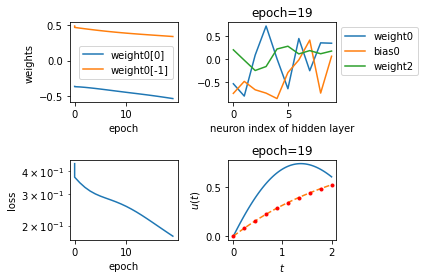

In [50]:
# reinitialize to clear trained nets
NN = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))
############################################ train ############################################
# Let's see now if a stochastic optimizer makes a difference
adam = torch.optim.Adam(NN.parameters(), lr=0.01)
# Adam: one-step optimization of stochastic objective function based on adaptive estimation of low-order moments. 

tspan = np.linspace(0, 2, 100)[:, None]

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

t=torch.linspace(0, 2, batchsize).reshape(-1,1)


epochList = []; w1List = []; w2List = []; lossList = [];

def animate(epoch):
    
    # Zero-out the gradient buffers
    adam.zero_grad()
    # Evaluate the loss
    l = loss(t)
    # Calculate the gradients
    l.backward()
    # Update the network
    adam.step()
    
    weight0 = list(NN[0].parameters())[0];weight0 = weight0.detach().numpy();
    bias0 = list(NN[0].parameters())[1];bias0 = bias0.detach().numpy();
    weight2 = list(NN[2].parameters())[0];weight2 = weight2.detach().numpy();
    
    
    epochList.append(epoch)
    w1List.append(float(weight0[0]))
    w2List.append(float(weight0[-1]))
#     w1List.append(float(weight2[:,0]))
#     w2List.append(float(weight2[:,-1]))
    lossList.append(float(l))    
    uNN = U(torch.Tensor(tspan)).detach().numpy()

    ax1.clear()# hold off
    line1,=ax1.plot(epochList,w1List,label="weight0[0]");
    line1,=ax1.plot(epochList,w2List,label="weight0[-1]");
    ax1.legend();ax1.set_xlabel('epoch');ax1.set_ylabel('weights')
#     line1,=ax1.semilogy(epochList,w1List);
#     line1,=ax1.semilogy(epochList,w2List);ax1.legend();
#   line1.set_data(epochList,w1List);line1.set_data(epochList,w2List);ax1.legend();

    ax2.clear()# hold off
    line2,=ax2.plot(weight0,label='weight0');ax2.plot(bias0,label='bias0');ax2.plot(weight2.T,label='weight2');
    ax2.set_title(f"epoch={epoch}");ax2.set_xlabel('neuron index of hidden layer');
    ax2.legend(bbox_to_anchor=(1, 1))# ax2.legend(loc='best')

    ax3.clear()# hold off
    line3, = ax3.semilogy(epochList, lossList)# line3, = ax3.plot(iList, lossList)
    ax3.set_xlabel('epoch');ax3.set_ylabel('loss');

    ax4.clear()# hold off
    ax4.set_title(f"epoch={epoch}");ax4.set_xlabel('$t$');ax4.set_ylabel('$u(t)$');
    line4,=ax4.plot(tspan,uA,label='analytic')
    ax4.plot(tspan,uNN,'--',label='NN')
    ax4.plot(t.detach().numpy(),U(torch.Tensor(t)).detach().numpy(), 'r.')# (t,uNN)采样点
    
    plt.tight_layout()#否则图部分遮住
    return line1,line2,line3,line4
    

import matplotlib.animation as animation
ani = animation.FuncAnimation(fig, animate, frames = epochs, interval=200, repeat=False, blit=True)
# ani.save('animation.gif',writer='ffmpeg',fps=1000)
from IPython.display import HTML
HTML(ani.to_jshtml()) # javascript-HTML Embed animation

# SGD

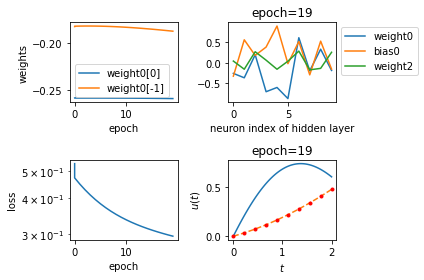

In [4]:
# reinitialize to clear trained nets
NN = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))
############################################ train ############################################
# Let's see now if a stochastic optimizer makes a difference
sgd = torch.optim.SGD(NN.parameters(), lr=0.01)
# Adam: one-step optimization of stochastic objective function based on adaptive estimation of low-order moments. 

tspan = np.linspace(0, 2, 100)[:, None]

############### init animate ###############
weight0 = list(NN[0].parameters())[0];weight0 = weight0.detach().numpy();
bias0 = list(NN[0].parameters())[1];bias0 = bias0.detach().numpy();
weight2 = list(NN[2].parameters())[0];weight2 = weight2.detach().numpy();
epochList = []; w1List = []; w2List = []; lossList = [];

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

t=torch.linspace(0, 2, batchsize).reshape(-1,1)
def animate(epoch):
    # Randomly pick batchsize*random t's:
#     t = 2 * torch.rand(batchsize, 1)
    
    # Zero-out the gradient buffers
    sgd.zero_grad()
    # Evaluate the loss
    l = loss(t)
    # Calculate the gradients
    l.backward()
    # Update the network
    sgd.step()
    
    epochList.append(epoch)
    w1List.append(float(weight0[0]))
    w2List.append(float(weight0[-1]))
#     w1List.append(float(weight2[:,0]))
#     w2List.append(float(weight2[:,-1]))
    lossList.append(float(l))    
    uNN = U(torch.Tensor(tspan)).detach().numpy()

    ax1.clear()# hold off
    line1,=ax1.plot(epochList,w1List,label="weight0[0]");
    line1,=ax1.plot(epochList,w2List,label="weight0[-1]");
    ax1.legend();ax1.set_xlabel('epoch');ax1.set_ylabel('weights')
#     line1,=ax1.semilogy(epochList,w1List);
#     line1,=ax1.semilogy(epochList,w2List);ax1.legend();
#   line1.set_data(epochList,w1List);line1.set_data(epochList,w2List);ax1.legend();

    ax2.clear()# hold off
    line2,=ax2.plot(weight0,label='weight0');ax2.plot(bias0,label='bias0');ax2.plot(weight2.T,label='weight2');
    ax2.set_title(f"epoch={epoch}");ax2.set_xlabel('neuron index of hidden layer');
    ax2.legend(bbox_to_anchor=(1, 1))# ax2.legend(loc='best')

    ax3.clear()# hold off
    line3, = ax3.semilogy(epochList, lossList)# line3, = ax3.plot(iList, lossList)
    ax3.set_xlabel('epoch');ax3.set_ylabel('loss');

    ax4.clear()# hold off
    ax4.set_title(f"epoch={epoch}");ax4.set_xlabel('$t$');ax4.set_ylabel('$u(t)$');
    line4,=ax4.plot(tspan,uA,label='analytic')
    ax4.plot(tspan,uNN,'--',label='NN')
    ax4.plot(t.detach().numpy(),U(torch.Tensor(t)).detach().numpy(), 'r.')# (t,uNN)采样点
    
    plt.tight_layout()#否则图部分遮住
    return line1,line2,line3,line4
    

import matplotlib.animation as animation
ani = animation.FuncAnimation(fig, animate, frames = epochs, interval=200, repeat=False, blit=True)
# ani.save('animation.gif',writer='ffmpeg',fps=1000)
from IPython.display import HTML
HTML(ani.to_jshtml()) # javascript-HTML Embed animation

# GD

In [196]:
epochs = 100 # number of epochs
learning_rate = 0.01
neurons = 2 # neurons in hidden layer

In [197]:
def sigmoid(t):
    s = 1/(1+torch.exp(-t))
    return s

uo=0
f = lambda t, u: torch.exp(-t/ 5.0) * torch.cos(t) - u/ 5.0
U = lambda t, w, w1, b: uo + t * NN(t)

def loss(w, w1, b, t):
    t.requires_grad = True
    Uot = U(t, w, w1, b)
    dudt = torch.autograd.grad(Uot,t,grad_outputs=torch.ones_like(Uot),create_graph=True)[0]
    return torch.mean((dudt-f(t,Uot))**2)

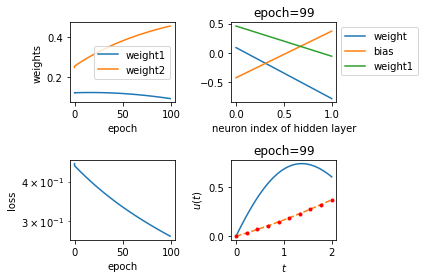

In [198]:
tspan = np.linspace(0, 2, 100)[:, None]
t=torch.linspace(0, 2, batchsize).reshape(-1,1)
uA = np.exp(-tspan/ 5.0) * np.sin(tspan)# analytic

epochList = []; w1List = []; w2List = []; lossList = [];

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

NN = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))



def animate(epoch):   
    w = list(NN[0].parameters())[0]; w.requires_grad = True
    b = list(NN[0].parameters())[1]; b.requires_grad = True
    w1 = list(NN[2].parameters())[0]; w1.requires_grad = True
    
    
#    Evaluate the loss
    l = loss(w, w1, b, t)
#    Calculate the gradients
    l.backward()

#   Update the network
    with torch.no_grad():
        w -= learning_rate * w.grad
        b -= learning_rate * b.grad
        w1 -= learning_rate * w1.grad
        
        # 更新完参数之后，需要手动地将这些梯度清零
        w.grad = None
        b.grad = None
        w1.grad = None
    
    epochList.append(epoch)
    w1List.append(float(w[0]))
    w2List.append(float(w1.T[0]))
#    bList.append(float(b[0]))

    lossList.append(float(l))    
    uNN = U(torch.Tensor(tspan), w, w1.T, b.T).detach().numpy()

    ax1.clear()# hold off
    line1,=ax1.plot(epochList,w1List,label="weight1");
    line1,=ax1.plot(epochList,w2List,label="weight2");
    ax1.legend();ax1.set_xlabel('epoch');ax1.set_ylabel('weights')

    ax2.clear()# hold off
#    x = np.arange(neurons)
    line2,=ax2.plot(w.detach().numpy(),label='weight');ax2.plot(b.T.detach().numpy(),label='bias');
    ax2.plot(w1.T.detach().numpy(),label='weight1')
    ax2.set_title(f"epoch={epoch}");ax2.set_xlabel('neuron index of hidden layer');
    ax2.legend(bbox_to_anchor=(1, 1))# ax2.legend(loc='best')

    ax3.clear()# hold off
    line3, = ax3.semilogy(epochList, lossList)# line3, = ax3.plot(iList, lossList)
    ax3.set_xlabel('epoch');ax3.set_ylabel('loss');

    ax4.clear()# hold off
    ax4.set_title(f"epoch={epoch}");ax4.set_xlabel('$t$');ax4.set_ylabel('$u(t)$');
    line4,=ax4.plot(tspan,uA,label='analytic'); 
    ax4.plot(tspan,uNN,'--',label='NN');
    ax4.plot(t.detach().numpy(),U(torch.Tensor(t), w, w1.T, b.T).detach().numpy(), 'r.');# (t,uNN)采样点
    
    plt.tight_layout()#否则图部分遮住
    return line1,line2,line3,line4
    

import matplotlib.animation as animation
ani = animation.FuncAnimation(fig, animate, frames = epochs, interval=200, repeat=False, blit=True)
# ani.save('animation.gif',writer='ffmpeg',fps=1000)
from IPython.display import HTML
HTML(ani.to_jshtml()) # javascript-HTML Embed animation

## GD code vs torch.optim.SGD
Under exactly the same conditions: same hyperparameters including the same initialization of weights.

In [359]:
import copy
epochs = 20 # number of epochs
learning_rate = 0.01
neurons = 2 # neurons in hidden layer

In [360]:
def sigmoid(t):
    s = 1/(1+torch.exp(-t))
    return s

uo=0
f = lambda t, u: torch.exp(-t/ 5.0) * torch.cos(t) - u/ 5.0
U1 = lambda t, w, w1, b: uo + t * NN_gd(t)

U2 = lambda t: uo + t * NN_sgd(t)

# loss function
def loss_1(w, w1, b, t):
    t.requires_grad = True
    Uot_gd = U1(t, w, w1, b)
    dudt_1 = torch.autograd.grad(Uot_gd,t,grad_outputs=torch.ones_like(Uot_gd),create_graph=True)[0]
    return torch.mean((dudt_1-f(t,Uot_gd))**2)


def loss_2(t):
    t.requires_grad = True
    Uot_sgd = U2(t)
    dudt_2 = torch.autograd.grad(Uot_sgd,t,grad_outputs=torch.ones_like(Uot_sgd),create_graph=True)[0]
    return torch.mean((dudt_2-f(t,Uot_sgd))**2)

In [361]:
# use copy to ensure the same initialization of weights
NN_sgd = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))
weight0 = list(NN_sgd[0].parameters())[0]
print(weight0)
NN_gd = copy.copy(NN_sgd)

#NN_gd = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))
w = list(NN_gd[0].parameters())[0]
print(w)

Parameter containing:
tensor([[0.2943],
        [0.9014]], requires_grad=True)
Parameter containing:
tensor([[0.2943],
        [0.9014]], requires_grad=True)


In [364]:
# if do not set the same initialization of weights,
# the lines will not overlap
NN_sgd = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))
weight0 = list(NN_sgd[0].parameters())[0]
print(weight0)
#NN_gd = copy.copy(NN_sgd)

NN_gd = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))
w = list(NN_gd[0].parameters())[0]
print(w)

Parameter containing:
tensor([[ 0.8642],
        [-0.7907]], requires_grad=True)
Parameter containing:
tensor([[-0.6361],
        [ 0.1883]], requires_grad=True)


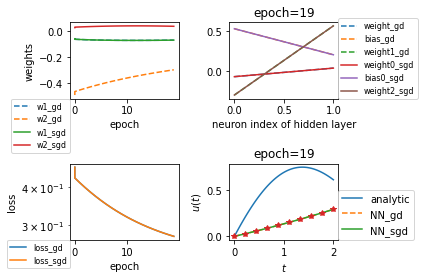

In [368]:
tspan = np.linspace(0, 2, 100)[:, None]
t=torch.linspace(0, 2, batchsize).reshape(-1,1)
uA = np.exp(-tspan/ 5.0) * np.sin(tspan)# analytic

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

# the same initialization of weights
NN_sgd = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))
# set SGD network
sgd = torch.optim.SGD(NN_sgd.parameters(), lr=0.01)

############### init animate ###############
weight0 = list(NN_sgd[0].parameters())[0];weight0 = weight0.detach().numpy();
bias0 = list(NN_sgd[0].parameters())[1];bias0 = bias0.detach().numpy();
weight2 = list(NN_sgd[2].parameters())[0];weight2 = weight2.detach().numpy();
epoch_sgd = []; w1_sgd = []; w2_sgd = []; loss_sgd = [];

################change the NN_gd to plot different figure################
NN_gd = copy.copy(NN_sgd)
#NN_gd = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))
# without the control of the same initialization of weights

epochList = []; w1List = []; w2List = []; lossList = [];

def animate(epoch):   
    w = list(NN_gd[0].parameters())[0]; w.requires_grad = True
    b = list(NN_gd[0].parameters())[1]; b.requires_grad = True
    w1 = list(NN_gd[2].parameters())[0]; w1.requires_grad = True
    
    
#    Evaluate the loss
    l1 = loss_1(w, w1, b, t)
    l2 = loss_2(t)

#    Calculate the gradients
    l1.backward()
    l2.backward()
    

#   Update the GD network
    with torch.no_grad():
        w -= learning_rate * w.grad
        b -= learning_rate * b.grad
        w1 -= learning_rate * w1.grad
        
        # 更新完参数之后，需要手动地将这些梯度清零
        w.grad = None
        b.grad = None
        w1.grad = None
        
    sgd.step()
    
    epochList.append(epoch)
    w1List.append(float(w[0]))
    w2List.append(float(w1.T[0]))
    lossList.append(float(l1))    
    uNN_gd = U1(torch.Tensor(tspan), w, w1.T, b.T).detach().numpy()
    
    epoch_sgd.append(epoch)
    w1_sgd.append(float(weight0[0]))
    w2_sgd.append(float(weight0[-1]))
    loss_sgd.append(float(l2))    
    uNN_sgd = U2(torch.Tensor(tspan)).detach().numpy()

  
    ax1.clear()# hold off
    line1,=ax1.plot(epochList,w1List,'--', label="w1_gd");
    line1,=ax1.plot(epochList,w2List,'--', label="w2_gd");
    
    line1,=ax1.plot(epoch_sgd,w1_sgd,label="w1_sgd");
    line1,=ax1.plot(epoch_sgd,w2_sgd,label="w2_sgd");
#    ax1.legend(loc='lower right', markerscale=0.1,  bbox_to_anchor=(1,1));
    ax1.legend(bbox_to_anchor=(0, 0), loc=0, borderaxespad=0, prop={'size': 8})
    ax1.set_xlabel('epoch');ax1.set_ylabel('weights')

    ax2.clear()# hold off
#    x = np.arange(neurons)
    line2,=ax2.plot(w.detach().numpy(),'--', label='weight_gd');
    ax2.plot(b.T.detach().numpy(),'--', label='bias_gd');
    ax2.plot(w1.T.detach().numpy(),'--', label='weight1_gd');
    
    ax2.plot(weight0,label='weight0_sgd');ax2.plot(bias0,label='bias0_sgd');ax2.plot(weight2.T,label='weight2_sgd');
    
    ax2.set_title(f"epoch={epoch}");ax2.set_xlabel('neuron index of hidden layer');
    ax2.legend(bbox_to_anchor=(1, 0), loc=3, borderaxespad=0, prop={'size': 8})# ax2.legend(loc='best')
#    ax2.legend(loc='lower right', markerscale=0.1,  bbox_to_anchor=(1,1));

    ax3.clear()# hold off
    line3, = ax3.semilogy(epochList, lossList, label='loss_gd')# line3, = ax3.plot(iList, lossList)
    line3, = ax3.semilogy(epoch_sgd, loss_sgd, label='loss_sgd')
    ax3.set_xlabel('epoch');ax3.set_ylabel('loss');
    ax3.legend(bbox_to_anchor=(0, 0), loc=0, borderaxespad=0, prop={'size': 8})
#    ax3.legend(loc='best', markerscale=0.1,  bbox_to_anchor=(1,1)); 

    ax4.clear()# hold off
    ax4.set_title(f"epoch={epoch}");ax4.set_xlabel('$t$');ax4.set_ylabel('$u(t)$');
    line4,=ax4.plot(tspan,uA,label='analytic'); 
    ax4.plot(tspan,uNN_gd,'--',label='NN_gd');
    ax4.plot(t.detach().numpy(),U1(torch.Tensor(t), w, w1.T, b.T).detach().numpy(), 'r.');# (t,uNN)采样点
    
    ax4.plot(tspan,uNN_sgd,label='NN_sgd');
    ax4.plot(t.detach().numpy(),U2(torch.Tensor(t)).detach().numpy(), '*');# (t,uNN)采样点
    ax4.legend(bbox_to_anchor=(1, 0), loc=3, borderaxespad=0)
#    ax4.legend(loc='best', markerscale=0.1,  bbox_to_anchor=(1,1));
    
    plt.tight_layout()#否则图部分遮住
    return line1,line2,line3,line4
    

import matplotlib.animation as animation
ani = animation.FuncAnimation(fig, animate, frames = epochs, interval=200, repeat=False, blit=True)
# ani.save('animation.gif',writer='ffmpeg',fps=1000)
from IPython.display import HTML
HTML(ani.to_jshtml()) # javascript-HTML Embed animation

# minibatch

In [267]:
epochs = 100 # number of epochs
learning_rate = 0.01
neurons = 2 # neurons in hidden layer

In [268]:
import math

def sigmoid(t):
    s = 1/(1+torch.exp(-t))
    return s

uo=0
f = lambda t, u: torch.exp(-t/ 5.0) * torch.cos(t) - u/ 5.0
U = lambda t, w, w1, b: uo + t * NN(t)

def loss(w, w1, b, t):
    t.requires_grad = True
    Uot = U(t, w, w1, b)
    dudt = torch.autograd.grad(Uot,t,grad_outputs=torch.ones_like(Uot),create_graph=True)[0]
    return torch.mean((-dudt+f(t,Uot))**2)

2


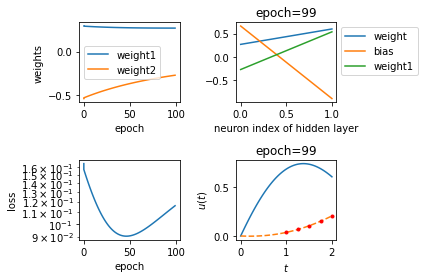

In [269]:
tspan = np.linspace(0, 2, 100)[:, None]
uA = np.exp(-tspan/ 5.0) * np.sin(tspan)# analytic

epochList = []; w1List = []; w2List = []; lossList = [];

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

NN = nn.Sequential(nn.Linear(1,neurons), nn.Sigmoid(), nn.Linear(neurons,1, bias=False))

######################自定义 minibatchsize######################
minibatchsize = 5
batchsize = 10
N = batchsize/minibatchsize
n = int(N)
print(n)

def animate(epoch):
    w = list(NN[0].parameters())[0]; w.requires_grad = True
    b = list(NN[0].parameters())[1]; b.requires_grad = True
    w1 = list(NN[2].parameters())[0]; w1.requires_grad = True
    

    for i in range(n):
        t = torch.linspace(i * 2/n, (i+1) * 2/n, minibatchsize).reshape(-1,1)
        # check whether i is updated
#        print(i)
        
        # Evaluate the loss
        l = loss(w, w1, b, t)
        # Calculate the gradients
        l.backward()
        
        with torch.no_grad():
            w -= torch.div(learning_rate, minibatchsize) * w.grad
            b -= torch.div(learning_rate, minibatchsize) * b.grad
            w1 -= torch.div(learning_rate, minibatchsize) * w1.grad
        
             # 更新完参数之后，需要手动地将这些梯度清零
            w.grad = None
            b.grad = None
            w1.grad = None

    
    epochList.append(epoch)
    w1List.append(float(w[0]))
    w2List.append(float(w1.T[0]))
#       bList.append(float(b[0]))

    lossList.append(float(l))    
    uNN = U(torch.Tensor(tspan), w, w1, b).detach().numpy()

    ax1.clear()# hold off
    line1,=ax1.plot(epochList,w1List,label="weight1");
    line1,=ax1.plot(epochList,w2List,label="weight2");
    ax1.legend();ax1.set_xlabel('epoch');ax1.set_ylabel('weights')

    ax2.clear()# hold off
    x = np.arange(neurons)
    line2,=ax2.plot(x, w.detach().numpy(),label='weight');ax2.plot(x, b.detach().numpy(),label='bias');
    ax2.plot(x, w1.T.detach().numpy(),label='weight1')
    ax2.set_title(f"epoch={epoch}");ax2.set_xlabel('neuron index of hidden layer');
    ax2.legend(bbox_to_anchor=(1, 1))# ax2.legend(loc='best')

    ax3.clear()# hold off
    line3, = ax3.semilogy(epochList, lossList)# line3, = ax3.plot(iList, lossList)
    ax3.set_xlabel('epoch');ax3.set_ylabel('loss');

    ax4.clear()# hold off
    ax4.set_title(f"epoch={epoch}");ax4.set_xlabel('$t$');ax4.set_ylabel('$u(t)$');
    line4,=ax4.plot(tspan,uA,label='analytic'); 
    ax4.plot(tspan,uNN,'--',label='NN');
    ax4.plot(t.detach().numpy(),U(torch.Tensor(t), w, w1, b).detach().numpy(), 'r.');# (t,uNN)采样点
    
    plt.tight_layout()#否则图部分遮住
    return line1,line2,line3,line4
    

import matplotlib.animation as animation
ani = animation.FuncAnimation(fig, animate, frames = epochs, interval=200, repeat=False, blit=True)
# ani.save('animation.gif',writer='ffmpeg',fps=1000)
from IPython.display import HTML
HTML(ani.to_jshtml()) # javascript-HTML Embed animation